# EIGENFACES

Con un dataset de imágenes recortadas de caras, buscar una representación en un espacio de dimensión reducida

<br><br><br>

In [71]:
%matplotlib inline
import numpy as np
import os
import matplotlib.pyplot as plt
import math
from pylab import imread,subplot,imshow,title,gray,figure,show

### 1. Leer archivos de imágenes

In [57]:
cwd = os.getcwd()

In [58]:
pwd

'/home/mlares/store/TeachJob/Astrometria/notebooks'

In [59]:
# pararse en este directorio:
dir_path = os.path.dirname(os.path.realpath(cwd))
dir_path = os.path.realpath(cwd)
print(dir_path)

/home/mlares/store/TeachJob/Astrometria/notebooks


In [60]:
!pwd
data_dir = "./data/CroppedYale"
#os.chdir(data_dir)

/home/mlares/all/TeachJob/Astrometria/notebooks


In [61]:
# Convertir de PGM a PNG (correr solo una vez!!!)
first_time=False

if first_time:
    from glob import glob

    %cd $data_dir

    files=glob('yaleB*/*.pgm')
    print('number of files is',len(files))
    count=0
    for f in files:
        new_f=f[:-3]+'png'
        !convert $f $new_f
        count += 1
        if count % 100==0:
            print(count,f,new_f)

In [72]:
def image_grid(D, H, W, cols=10, scale=1):
    """ Shows a grid of images
    
        H,W: Height and width of the images
        cols: number of columns = number of images in each row
        scale: 1 to fill screen
    """
    n = np.shape(D)[0]
    rows = int(math.ceil((n+0.0)/cols))
    fig = plt.figure(1,figsize=[scale*20.0/H*W,scale*20.0/cols*rows],dpi=300)
    for i in range(n):
        plt.subplot(rows,cols,i+1)
        fig=plt.imshow(np.reshape(D[i,:],[H,W]), cmap = plt.get_cmap("gray"))
        plt.axis('off')

In [73]:
def create_filenames(data_dir, view_list):
    """
    Loads the picture names into a list
    
    data_dir: the CroppedYale folder
    view_list: the views you wish to grab
    """
    dir_list = os.listdir(data_dir)  # lista de directorios
    file_list = []
    for dir in dir_list:
        for view in view_list:
            filename = f'{data_dir}/{dir}/{dir}_{view}.png'   # "%s/%s_%s.png" % (dir, dir, view)
            file_list.append(filename)
    return(file_list)

In [74]:
data_dir

'./data/CroppedYale'

In [77]:
view_list = ['P00A+000E+00', 'P00A+005E+10' , 'P00A+005E-10' , 'P00A+010E+00']

file_list = create_filenames(data_dir, view_list)
print(f'Hay {len(file_list)} imágenes en este directorio')

Hay 152 imágenes en este directorio


In [81]:
file_list[0]

'./data/CroppedYale/yaleB28/yaleB28_P00A+000E+00.png'

In [87]:
os.path.dirname(file_list[0])

'./data/CroppedYale/yaleB28'

<br><br>
### 2. Visualización

shape= (192, 168)


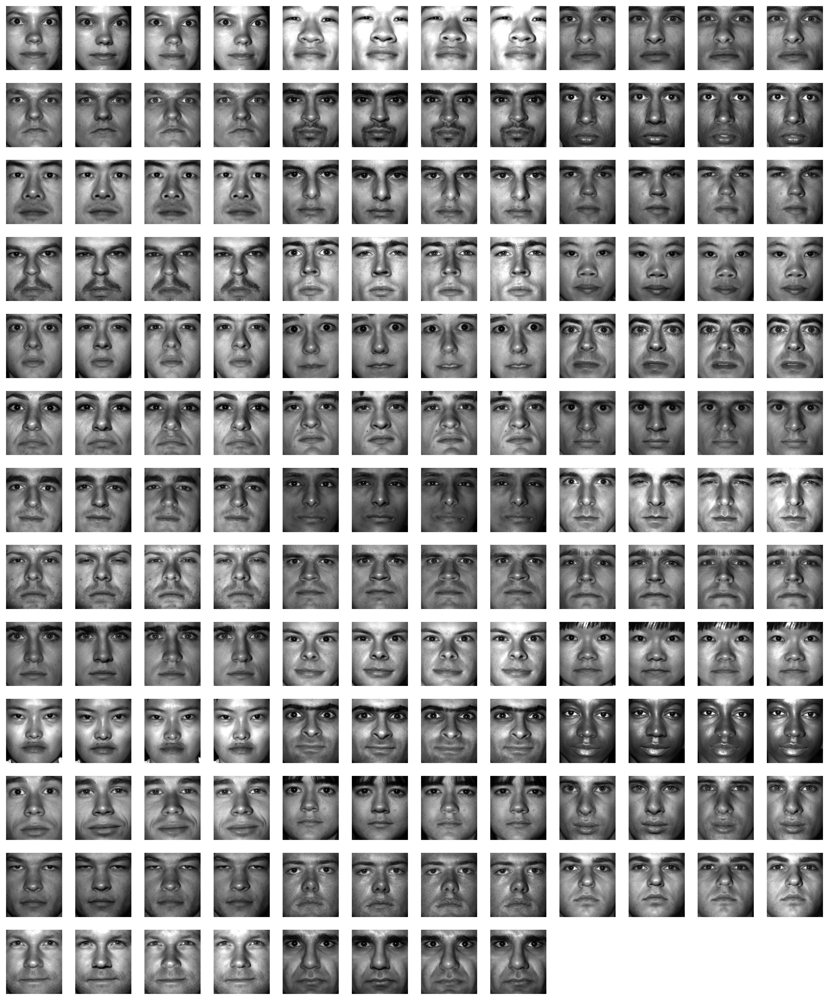

In [88]:
# open image
im = imread(file_list[0])

#im = Image.open(file_list[0]).convert("L")
# get original dimensions
H, W = np.shape(im)
print ('shape=',(H,W))

im_number = len(file_list)
# fill array with rows as image
# and columns as pixels
arr = np.zeros([im_number,H*W])

for i in range(im_number):
    im = imread(file_list[i])
    arr[i,:] = np.reshape(np.asarray(im),[1,H*W])

image_grid(arr, H, W, cols=12)

<br><br>
### 3. Cara promedio

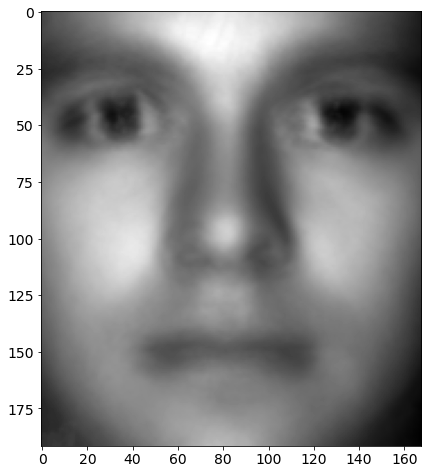

In [92]:
mean_image = np.mean(arr, axis=0)
plt.figure(figsize = (8,8))
mean_face = np.reshape(mean_image,[H,W])
plt.imshow(mean_face, cmap = plt.get_cmap("gray"))

In [98]:
arr.shape

(152, 32256)

In [105]:
192*168

32256

In [120]:
M = arr[1, :].reshape([H,W])
M

array([[0.12941177, 0.08627451, 0.06666667, ..., 0.06666667, 0.05490196,
        0.03529412],
       [0.1254902 , 0.08235294, 0.07058824, ..., 0.05882353, 0.05098039,
        0.03529412],
       [0.11764706, 0.07843138, 0.0627451 , ..., 0.04313726, 0.04313726,
        0.03921569],
       ...,
       [0.10980392, 0.11372549, 0.13725491, ..., 0.04313726, 0.04705882,
        0.03921569],
       [0.09803922, 0.10980392, 0.1254902 , ..., 0.03137255, 0.03137255,
        0.03137255],
       [0.08627451, 0.09019608, 0.09411765, ..., 0.01960784, 0.02352941,
        0.03137255]])

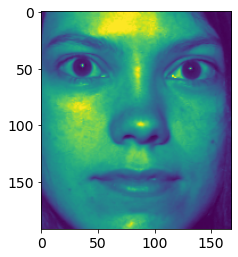

In [122]:
plt.imshow(M)

In [138]:
M = np.reshape(np.mean(arr[[0,1,2,3], :], axis=0), [H, W])

In [139]:
M.shape

(192, 168)

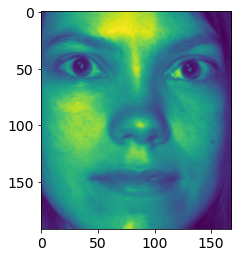

In [140]:
plt.imshow(M)

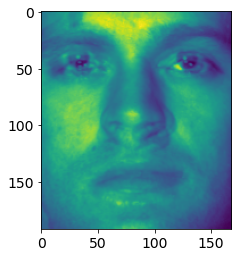

In [145]:
M = np.reshape(np.mean(arr[[23,67,87,91], :], axis=0), [H, W])
plt.imshow(M)

### 4. Centrar los datos

In [100]:
# centering the data (subtract mean face)
arr_norm = np.zeros([im_number, H*W])
arr_norm = arr - mean_image

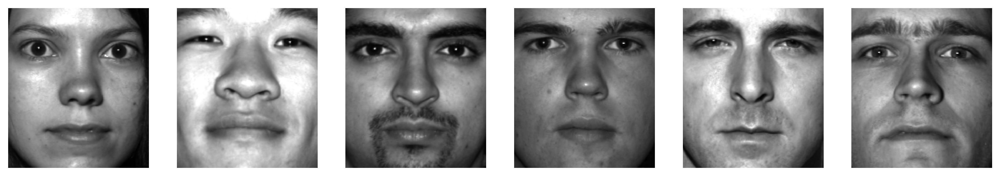

In [103]:
# graficamos algunas caras:
idxs = [1,4,16,32,81,95]
image_grid(arr[idxs,:],H,W, scale=1.5)

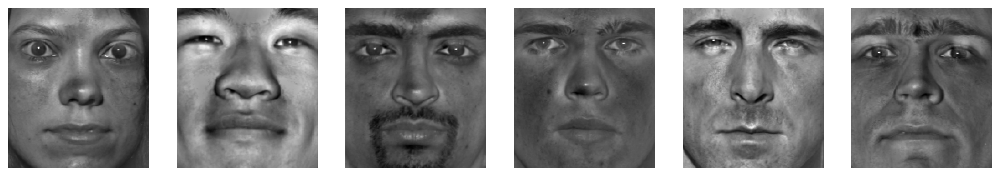

In [104]:
# y ahora las versiones normalizadas
image_grid(arr_norm[idxs,:],H,W, scale=1.5)

### 5. PCA en python con sklearn

In [151]:
from sklearn.decomposition import PCA

In [152]:
pca = PCA()
pca.fit(arr_norm)

PCA()

### Eigenfaces:

In [179]:
# eigenfaces
eigenfaces = pca.components_

In [188]:
len(eigenfaces)

152

<br>
Veamos el primer autovector:

In [190]:
eigenfaces[0]

array([0.00461455, 0.00456251, 0.00463936, ..., 0.0030781 , 0.00301745,
       0.00296908])

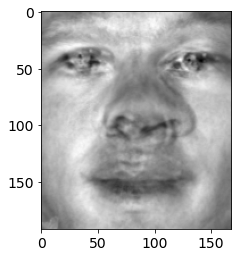

In [192]:
plt.imshow(np.reshape(eigenfaces[0], [H, W]))

<br>
Ahora los primeros 10 autovectores:

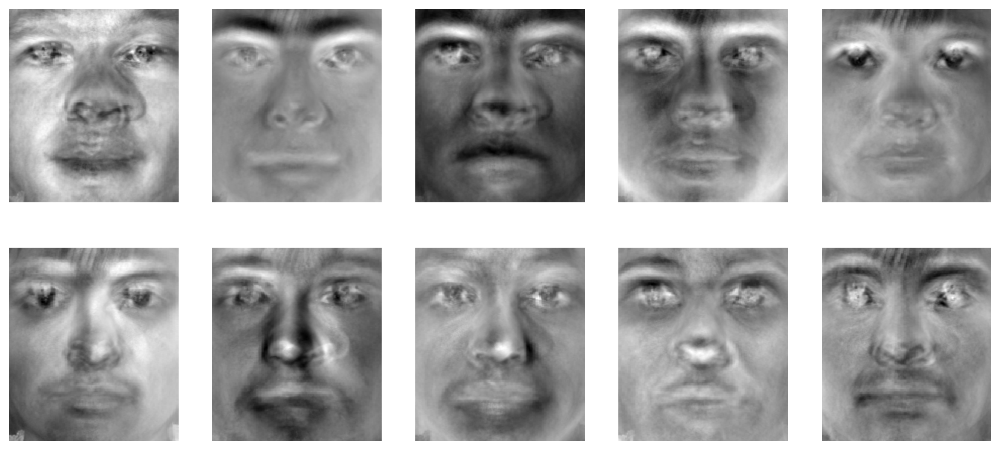

In [194]:
image_grid(eigenfaces[:10,:], H, W, cols=5, scale=0.8)

<br><br>
Reducción de dimensionalidad

Elegimos una cara cualquiera y la escribimos en términos de las primeras componentes principales

In [253]:
# ID en el rango 0, 151
img_idx = 40

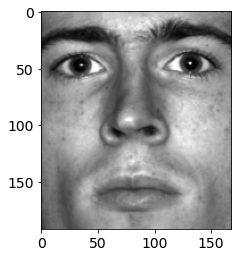

In [254]:
im = imread(file_list[img_idx])
plt.gray()
plt.imshow(im)

In [255]:
loadings = pca.components_

In [256]:
loadings.shape

(152, 32256)

In [257]:
n_components = loadings.shape[0]
scores = np.dot(arr_norm[:,:], loadings[:,:].T)

img_proj = []
for n in range(n_components):
    proj = np.dot(scores[img_idx, n], loadings[n,:])
    img_proj.append(proj)
len(img_proj)

152

In [258]:
faces = mean_image
face_list = []
face_list.append(mean_image)
for i in range(len(img_proj)):
    faces = np.add(faces, img_proj[i])
    face_list.append(faces)

face_arr = np.asarray(face_list)
face_arr.shape

(153, 32256)

Dibujemos una cara con las primeras N componentes

In [259]:
face_arr[5,:]

array([0.42854855, 0.44274342, 0.46218176, ..., 0.33743184, 0.32440155,
       0.31757992])

In [260]:
np.reshape(face_arr[5,:],[H,W])

array([[0.42854855, 0.44274342, 0.46218176, ..., 0.4312639 , 0.42506824,
        0.42332131],
       [0.43145715, 0.44316305, 0.45405496, ..., 0.42885497, 0.41848088,
        0.41873319],
       [0.43183441, 0.44153842, 0.45708941, ..., 0.41759738, 0.42264608,
        0.41935206],
       ...,
       [0.23383276, 0.2621332 , 0.28867427, ..., 0.33675903, 0.31614856,
        0.30110421],
       [0.21645431, 0.2418595 , 0.27435741, ..., 0.33464837, 0.3210138 ,
        0.31377466],
       [0.20759239, 0.23216329, 0.2665347 , ..., 0.33743184, 0.32440155,
        0.31757992]])

In [261]:
Ncomp = 30

(-0.5, 167.5, 191.5, -0.5)

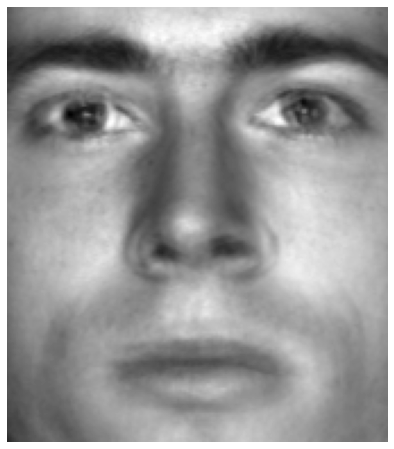

In [262]:
fig = plt.figure(1,figsize=[8,8])
ax = fig.add_subplot()
M = np.reshape(face_arr[Ncomp,:], [H, W])
plt.imshow(M, cmap = plt.get_cmap("gray"))
plt.axis('off')

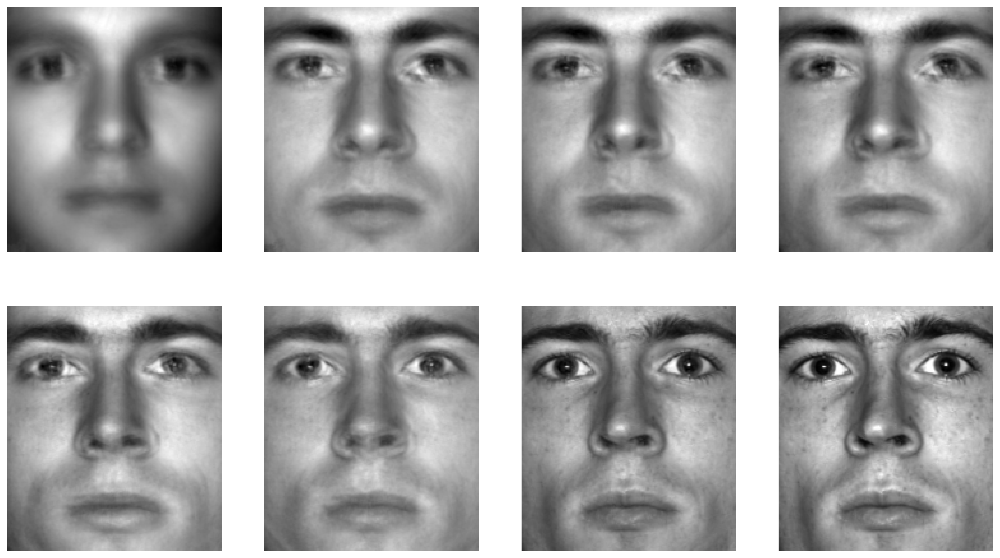

In [263]:
i = [0, 5, 10, 20, 30, 40, 50, 100]
#image_grid(face_arr[:25], H, W, cols=4)
image_grid(face_arr[i], H, W, cols=4)